# Simulation using Concord

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import scanpy as sc
import time
from pathlib import Path
import torch
import Concord as ccd
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
import matplotlib as mpl

from matplotlib import font_manager, rcParams
custom_rc = {
    'font.family': 'Arial',  # Set the desired font for this plot
}

mpl.rcParams['svg.fonttype'] = 'none'
mpl.rcParams['pdf.fonttype'] = 42

In [3]:
proj_name = "simulation_cluster_pdomain"
save_dir = f"../save/dev_{proj_name}-{time.strftime('%b%d')}/"
save_dir = Path(save_dir)
save_dir.mkdir(parents=True, exist_ok=True)

data_dir = f"../data/{proj_name}/"
data_dir = Path(data_dir)
data_dir.mkdir(parents=True, exist_ok=True)
device = torch.device('cuda:3' if torch.cuda.is_available() else 'cpu')
print(device)
seed = 0
ccd.ul.set_seed(seed)

file_suffix = f"{time.strftime('%b%d-%H%M')}"
file_suffix

cpu


'Feb07-1429'

In [4]:
state_key = 'cluster'
batch_key = 'batch'
state_type = 'cluster'
leiden_key='leiden'
batch_type = 'batch_specific_features'
distribution = 'normal'
n_cells = [200,100,100,50,30]
n_genes = [100,100,50,30,20]
state_dispersion = [5.0,4.0,4.0,3.0,2.0]


## Concord with different p_intra_domain

In [7]:
# adata = sc.read(data_dir / f"adata_Nov19-1505.h5ad")
# adata_state = sc.read(data_dir / f"adata_state_Nov19-1505.h5ad")
adata = sc.read(Path("../data/simulation_cluster/") / f"adata_Nov29-1033.h5ad")
adata_state = sc.read(Path("../data/simulation_cluster/") / f"adata_state_Nov29-1033.h5ad")

In [39]:
concord_args_base = {
    'input_feature': None,
    'n_epochs': 10,
    'p_intra_knn': 0.3,
    'batch_size':64,
    'domain_key': batch_key,
    'seed': seed,
    'device': device,
    'save_dir': save_dir
}

In [40]:
# -------------------------------------
# 2. Prepare dictionary of parameter variations
#    (one parameter at a time)
# -------------------------------------
import copy
param_variations = {
    'p_intra_domain': [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0],  # Example: vary p_intra_knn
    #'p_intra_knn': [0.0, 0.3, 0.5, 0.7, 1.0 ],  # Example: vary p_intra_knn
}
param_keys = []
# -------------------------------------
# 3. Loop over each parameter to vary
# -------------------------------------
for param_name, values in param_variations.items():
    print(f"\n[INFO] Varying '{param_name}' with possible values: {values}\n")
    
    for value in values:
        # 3a. Copy the base arguments
        concord_args = copy.deepcopy(concord_args_base)
        
        # 3b. Update the specific parameter we want to vary
        concord_args[param_name] = value
        
        # 3c. Indicate which param is varied and to which value
        output_key = f"Concord_{param_name}_{value}"
        umap_key   = output_key + '_UMAP'
        param_keys.append(output_key)
        print(f"[INFO] Running Concord with {param_name} = {value}")
        
        # -------------------------------------
        # 4. Run Concord
        # -------------------------------------
        cur_ccd = ccd.Concord(adata, **concord_args)

        # Encode data, saving the latent embedding in adata.obsm[output_key]
        cur_ccd.encode_adata(
            input_layer_key='X',
            output_key=output_key,
            preprocess=False
        )       

print("[DONE] Finished varying each parameter individually.")



[INFO] Varying 'p_intra_domain' with possible values: [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]

[INFO] Running Concord with p_intra_domain = 0.0
Concord - WARNING - No input feature list provided. It is recommended to first select features using the command `concord.ul.select_features()`.


Concord - WARNING - p_intra_knn * batch_size (19) is greater than sampler_knn (9). This will cause actual sampling ratio not matching specified p_intra_knn.
Concord - WARNING - You should either set batch_size to be smaller than sampler_knn/p_intra_knn (30)
Concord - WARNING - or set sampler_knn to be greater than p_intra_knn * batch_size (19).
Concord.model.knn - WARNING - FAISS not found. Using sklearn for k-NN computation.
p_intra_knn: 0.3


Epoch 0 Training: 6it [00:00, 88.58it/s, loss=4.07]
Epoch 9 Training: 100%|██████████| 6/6 [00:00<00:00, 132.17it/s, loss=3.64]


[INFO] Running Concord with p_intra_domain = 0.1
Concord - WARNING - No input feature list provided. It is recommended to first select features using the command `concord.ul.select_features()`.
Concord - WARNING - p_intra_knn * batch_size (19) is greater than sampler_knn (9). This will cause actual sampling ratio not matching specified p_intra_knn.
Concord - WARNING - You should either set batch_size to be smaller than sampler_knn/p_intra_knn (30)
Concord - WARNING - or set sampler_knn to be greater than p_intra_knn * batch_size (19).
Concord.model.knn - WARNING - FAISS not found. Using sklearn for k-NN computation.
p_intra_knn: 0.3


Epoch 0 Training: 6it [00:00, 125.29it/s, loss=4.09]
Epoch 9 Training: 100%|██████████| 6/6 [00:00<00:00, 130.28it/s, loss=3.65]


[INFO] Running Concord with p_intra_domain = 0.2
Concord - WARNING - No input feature list provided. It is recommended to first select features using the command `concord.ul.select_features()`.
Concord - WARNING - p_intra_knn * batch_size (19) is greater than sampler_knn (9). This will cause actual sampling ratio not matching specified p_intra_knn.
Concord - WARNING - You should either set batch_size to be smaller than sampler_knn/p_intra_knn (30)
Concord - WARNING - or set sampler_knn to be greater than p_intra_knn * batch_size (19).
Concord.model.knn - WARNING - FAISS not found. Using sklearn for k-NN computation.
p_intra_knn: 0.3


Epoch 0 Training: 6it [00:00, 140.12it/s, loss=4.03]
Epoch 9 Training: 100%|██████████| 6/6 [00:00<00:00, 140.23it/s, loss=3.63]

[INFO] Running Concord with p_intra_domain = 0.3
Concord - WARNING - No input feature list provided. It is recommended to first select features using the command `concord.ul.select_features()`.
Concord - WARNING - p_intra_knn * batch_size (19) is greater than sampler_knn (9). This will cause actual sampling ratio not matching specified p_intra_knn.
Concord - WARNING - You should either set batch_size to be smaller than sampler_knn/p_intra_knn (30)
Concord - WARNING - or set sampler_knn to be greater than p_intra_knn * batch_size (19).
Concord.model.knn - WARNING - FAISS not found. Using sklearn for k-NN computation.


p_intra_knn: 0.3


Epoch 0 Training: 6it [00:00, 86.62it/s, loss=4]
Epoch 9 Training: 100%|██████████| 6/6 [00:00<00:00, 138.50it/s, loss=3.65]

[INFO] Running Concord with p_intra_domain = 0.4
Concord - WARNING - No input feature list provided. It is recommended to first select features using the command `concord.ul.select_features()`.
Concord - WARNING - p_intra_knn * batch_size (19) is greater than sampler_knn (9). This will cause actual sampling ratio not matching specified p_intra_knn.
Concord - WARNING - You should either set batch_size to be smaller than sampler_knn/p_intra_knn (30)
Concord - WARNING - or set sampler_knn to be greater than p_intra_knn * batch_size (19).
Concord.model.knn - WARNING - FAISS not found. Using sklearn for k-NN computation.


p_intra_knn: 0.3


Epoch 0 Training: 6it [00:00, 104.32it/s, loss=3.93]
Epoch 9 Training: 100%|██████████| 6/6 [00:00<00:00, 133.74it/s, loss=3.6]

[INFO] Running Concord with p_intra_domain = 0.5
Concord - WARNING - No input feature list provided. It is recommended to first select features using the command `concord.ul.select_features()`.
Concord - WARNING - p_intra_knn * batch_size (19) is greater than sampler_knn (9). This will cause actual sampling ratio not matching specified p_intra_knn.
Concord - WARNING - You should either set batch_size to be smaller than sampler_knn/p_intra_knn (30)
Concord - WARNING - or set sampler_knn to be greater than p_intra_knn * batch_size (19).
Concord.model.knn - WARNING - FAISS not found. Using sklearn for k-NN computation.


p_intra_knn: 0.3


Epoch 0 Training: 6it [00:00, 95.68it/s, loss=3.99]
Epoch 9 Training: 100%|██████████| 6/6 [00:00<00:00, 128.88it/s, loss=3.69]


[INFO] Running Concord with p_intra_domain = 0.6
Concord - WARNING - No input feature list provided. It is recommended to first select features using the command `concord.ul.select_features()`.
Concord - WARNING - p_intra_knn * batch_size (19) is greater than sampler_knn (9). This will cause actual sampling ratio not matching specified p_intra_knn.
Concord - WARNING - You should either set batch_size to be smaller than sampler_knn/p_intra_knn (30)
Concord - WARNING - or set sampler_knn to be greater than p_intra_knn * batch_size (19).
Concord.model.knn - WARNING - FAISS not found. Using sklearn for k-NN computation.
p_intra_knn: 0.3


Epoch 0 Training: 6it [00:00, 96.31it/s, loss=4]
Epoch 9 Training: 100%|██████████| 6/6 [00:00<00:00, 107.14it/s, loss=3.69]


[INFO] Running Concord with p_intra_domain = 0.7
Concord - WARNING - No input feature list provided. It is recommended to first select features using the command `concord.ul.select_features()`.
Concord - WARNING - p_intra_knn * batch_size (19) is greater than sampler_knn (9). This will cause actual sampling ratio not matching specified p_intra_knn.
Concord - WARNING - You should either set batch_size to be smaller than sampler_knn/p_intra_knn (30)
Concord - WARNING - or set sampler_knn to be greater than p_intra_knn * batch_size (19).
Concord.model.knn - WARNING - FAISS not found. Using sklearn for k-NN computation.
p_intra_knn: 0.3


Epoch 0 Training: 6it [00:00, 81.64it/s, loss=4.08]
Epoch 9 Training: 100%|██████████| 6/6 [00:00<00:00, 144.62it/s, loss=3.69]


[INFO] Running Concord with p_intra_domain = 0.8
Concord - WARNING - No input feature list provided. It is recommended to first select features using the command `concord.ul.select_features()`.
Concord - WARNING - p_intra_knn * batch_size (19) is greater than sampler_knn (9). This will cause actual sampling ratio not matching specified p_intra_knn.
Concord - WARNING - You should either set batch_size to be smaller than sampler_knn/p_intra_knn (30)
Concord - WARNING - or set sampler_knn to be greater than p_intra_knn * batch_size (19).
Concord.model.knn - WARNING - FAISS not found. Using sklearn for k-NN computation.
p_intra_knn: 0.3


Epoch 0 Training: 6it [00:00, 91.23it/s, loss=4.21]
Epoch 9 Training: 100%|██████████| 6/6 [00:00<00:00, 118.05it/s, loss=3.73]

[INFO] Running Concord with p_intra_domain = 0.9
Concord - WARNING - No input feature list provided. It is recommended to first select features using the command `concord.ul.select_features()`.
Concord - WARNING - p_intra_knn * batch_size (19) is greater than sampler_knn (9). This will cause actual sampling ratio not matching specified p_intra_knn.
Concord - WARNING - You should either set batch_size to be smaller than sampler_knn/p_intra_knn (30)
Concord - WARNING - or set sampler_knn to be greater than p_intra_knn * batch_size (19).
Concord.model.knn - WARNING - FAISS not found. Using sklearn for k-NN computation.


p_intra_knn: 0.3


Epoch 0 Training: 6it [00:00, 91.06it/s, loss=4.19]
Epoch 9 Training: 100%|██████████| 6/6 [00:00<00:00, 127.47it/s, loss=3.76]

[INFO] Running Concord with p_intra_domain = 1.0
Concord - WARNING - No input feature list provided. It is recommended to first select features using the command `concord.ul.select_features()`.
Concord - WARNING - p_intra_knn * batch_size (19) is greater than sampler_knn (9). This will cause actual sampling ratio not matching specified p_intra_knn.
Concord - WARNING - You should either set batch_size to be smaller than sampler_knn/p_intra_knn (30)
Concord - WARNING - or set sampler_knn to be greater than p_intra_knn * batch_size (19).
Concord.model.knn - WARNING - FAISS not found. Using sklearn for k-NN computation.


p_intra_knn: 0.3


Epoch 0 Training: 6it [00:00, 96.21it/s, loss=4.18]
Epoch 9 Training: 100%|██████████| 6/6 [00:00<00:00, 110.77it/s, loss=3.77]


[DONE] Finished varying each parameter individually.


In [41]:
combined_keys = ['PCA_no_noise', 'PCA_wt_noise'] + param_keys
for key in combined_keys:
    ccd.ul.run_umap(adata, source_key=key, result_key=key + '_UMAP', random_state=seed, min_dist=0.5, metric='cosine')

In [42]:
combined_keys

['PCA_no_noise',
 'PCA_wt_noise',
 'Concord_p_intra_domain_0.0',
 'Concord_p_intra_domain_0.1',
 'Concord_p_intra_domain_0.2',
 'Concord_p_intra_domain_0.3',
 'Concord_p_intra_domain_0.4',
 'Concord_p_intra_domain_0.5',
 'Concord_p_intra_domain_0.6',
 'Concord_p_intra_domain_0.7',
 'Concord_p_intra_domain_0.8',
 'Concord_p_intra_domain_0.9',
 'Concord_p_intra_domain_1.0']

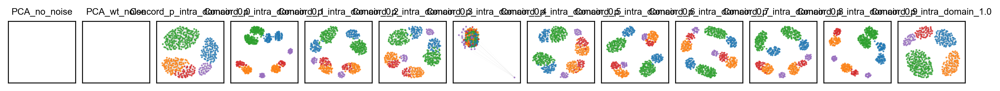

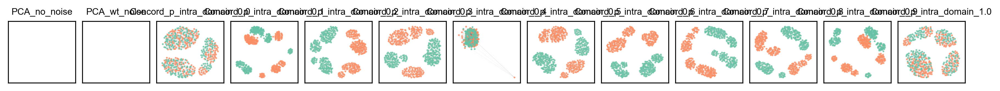

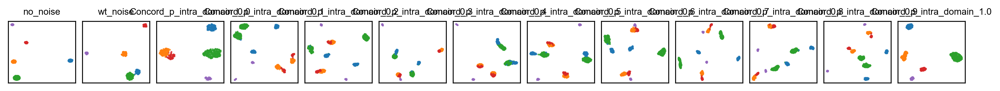

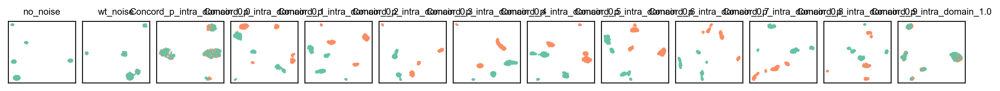

In [43]:
# plot everything
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib import font_manager, rcParams
file_suffix = f"{time.strftime('%b%d-%H%M')}"
# Set Arial as the default font
custom_rc = {
    'font.family': 'Arial',  # Set the desired font for this plot
}

color_bys = [state_key, batch_key]
#color_bys = [state_key]
pal={
    'cluster': 'tab10',
    'batch': 'Set2',
}
#basis_types = ['', 'PAGA', 'KNN', 'PCA', 'UMAP']
basis_types = ['KNN', 'UMAP']
font_size=8
point_size=10
alpha=0.8
figsize=(0.9*len(combined_keys),1)
ncols = len(combined_keys)
nrows = int(np.ceil(len(param_keys) / ncols))
k=15
edges_color='grey'
edges_width=0.01
layout='kk'
threshold = 0.1
node_size_scale=0.1
edge_width_scale=0.1

with plt.rc_context(rc=custom_rc):
    ccd.pl.plot_all_embeddings(
        adata,
        combined_keys,
        color_bys=color_bys,
        basis_types=basis_types,
        pal=pal,
        k=k,
        edges_color=edges_color,
        edges_width=edges_width,
        layout=layout,
        threshold=threshold,
        node_size_scale=node_size_scale,
        edge_width_scale=edge_width_scale,
        font_size=font_size,
        point_size=point_size,
        alpha=alpha,
        figsize=figsize,
        ncols=ncols,
        seed=seed,
        leiden_key='leiden',
        save_dir=save_dir,
        file_suffix=file_suffix,
        save_format='pdf'
    )


In [36]:
cur_ccd = ccd.Concord(adata=adata, 
                      input_feature=None, 
                      batch_size=64,
                      n_epochs=10,
                      #use_decoder=False,
                      domain_key=batch_key, # key indicating batch
                      seed=seed, # random seed
                      verbose=False, # print training progress
                      device=device, # device to run on
                      save_dir=save_dir # directory to save model checkpoints
                      ) 

# Encode data, saving the latent embedding in adata.obsm['Concord']
output_key = 'Concord2'

cur_ccd.encode_adata(input_layer_key='X', output_key=output_key, preprocess=False)

# Save the latent embedding to a file, so that it can be loaded later
ccd.ul.save_obsm_to_hdf5(cur_ccd.adata, save_dir / f"obsm_{file_suffix}.h5")

Concord - WARNING - No input feature list provided. It is recommended to first select features using the command `concord.ul.select_features()`.
Concord - WARNING - p_intra_knn * batch_size (19) is greater than sampler_knn (9). This will cause actual sampling ratio not matching specified p_intra_knn.
Concord - WARNING - You should either set batch_size to be smaller than sampler_knn/p_intra_knn (30)
Concord - WARNING - or set sampler_knn to be greater than p_intra_knn * batch_size (19).
Concord.model.knn - WARNING - FAISS not found. Using sklearn for k-NN computation.
p_intra_knn: 0.3


Epoch 0 Training: 6it [00:00, 159.00it/s, loss=4.18]
Epoch 9 Training: 100%|██████████| 6/6 [00:00<00:00, 156.81it/s, loss=3.63]


# Evaluation

In [6]:
data_dir

PosixPath('../data/simulation_cluster')

In [7]:
# adata = sc.read(data_dir / f"adata_Nov19-1505.h5ad")
# adata_state = sc.read(data_dir / f"adata_state_Nov19-1505.h5ad")
adata = sc.read(data_dir / f"adata_Nov29-1033.h5ad")
adata_state = sc.read(data_dir / f"adata_state_Nov29-1033.h5ad")

In [6]:
latent_keys = ["Unintegrated", "Scanorama", "Liger", "Harmony", "scVI", "scANVI", "Concord", 'Concord-decoder', "Concord-class"]
ground_keys = ['PCA_no_noise', 'PCA_wt_noise']
combined_keys = latent_keys + ground_keys
n_pc=30
ccd.ul.run_pca(adata_state, source_key='no_noise', result_key='PCA_no_noise', n_pc=n_pc, random_state=seed)
ccd.ul.run_pca(adata_state, source_key='wt_noise', result_key='PCA_wt_noise', n_pc=n_pc, random_state=seed)

# Put the PCA result in the adata object, so only one object is needed
adata.obsm['PCA_no_noise'] = adata_state.obsm['PCA_no_noise']
adata.obsm['PCA_wt_noise'] = adata_state.obsm['PCA_wt_noise']
adata.obsm

Concord - INFO - PCA performed on source data with 30 components
Concord - INFO - PCA embedding stored in adata.obsm['PCA_no_noise']
Concord - INFO - PCA performed on source data with 30 components
Concord - INFO - PCA embedding stored in adata.obsm['PCA_wt_noise']


AxisArrays with keys: Concord, Concord-class, Concord-class_UMAP, Concord-decoder, Concord-decoder_UMAP, Concord_PCA, Concord_UMAP, Concord_UMAP_2D, Harmony, Harmony_UMAP, Liger, Liger_UMAP, Scanorama, Scanorama_UMAP, Unintegrated, X_pca, X_umap, scANVI, scANVI_UMAP, scVI, scVI_UMAP, PCA_no_noise, PCA_wt_noise

### Scib

In [27]:
from scib_metrics.benchmark import Benchmarker
bm = Benchmarker(
    adata,
    batch_key=batch_key,
    label_key=state_key,
    embedding_obsm_keys=latent_keys,
    n_jobs=6,
)
bm.benchmark()

Computing neighbors:   0%|          | 0/9 [00:00<?, ?it/s]

Embeddings: 100%|██████████| 9/9 [00:21<00:00,  2.41s/it]


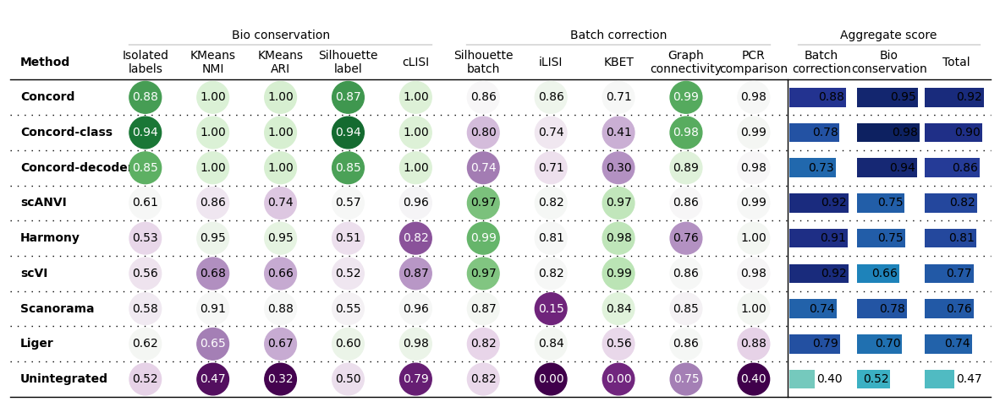

In [76]:
import matplotlib.pyplot as plt
import os
bm.plot_results_table(min_max_scale=False, show=False)
fig = plt.gcf()
fig.set_size_inches(15, 6) 
fig.savefig(os.path.join(save_dir, f'scibmetrics_results_{file_suffix}.pdf'), facecolor='white', dpi=600)
plt.show()
plt.close(fig)

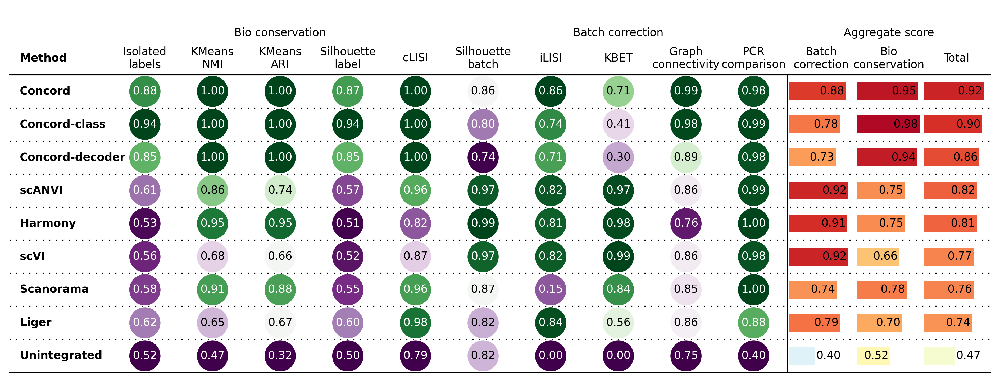

In [28]:
scib_scores = bm.get_results(min_max_scale=False)
# Convert row 'Metric Type' to multi-index column, first level is 'Metric Type', second level is existing column name
metric_type = scib_scores.loc['Metric Type']
scib_scores = scib_scores.drop('Metric Type')  # Drop the last row now that it's stored in metric_type
scib_scores.columns = pd.MultiIndex.from_tuples([(metric_type[col], col) for col in scib_scores.columns])
scib_scores = ccd.ul.benchmark_stats_to_score(scib_scores, min_max_scale=False, one_minus=False, aggregate_score=False, rank=True, rank_col=('Aggregate score', 'Total'), name_exact=False)

ccd.pl.plot_benchmark_table(scib_scores, pal='PRGn', pal_agg='RdYlBu_r', cmap_method = 'minmax', save_path=save_dir / f"scib_results_{file_suffix}.pdf", figsize=(16, 6), dpi=300)

### Topology

Run topological analysis pipeline:

In [29]:
homology_dimensions = [0,1,2]
#concord_keys = ['Concord', 'Concord-decoder', 'Concord-class']
diagrams = {}
for key in combined_keys:
#for key in concord_keys:
    print(f"Computing persistent homology for {key}")
    diagrams[key] =  ccd.ul.compute_persistent_homology(adata, key=key, homology_dimensions=homology_dimensions)

import pickle
with open(save_dir / f"topology_diagrams_{file_suffix}.pkl", 'wb') as f:
    pickle.dump(diagrams, f)

Computing persistent homology for PCA_no_noise


Computing persistent homology for PCA_wt_noise
Computing persistent homology for Unintegrated
Computing persistent homology for Scanorama
Computing persistent homology for Liger
Computing persistent homology for Harmony
Computing persistent homology for scVI
Computing persistent homology for scANVI
Computing persistent homology for Concord
Computing persistent homology for Concord-decoder
Computing persistent homology for Concord-class


In [30]:
save_dir / f"topology_diagrams_{file_suffix}.pkl"

PosixPath('../save/dev_simulation_cluster-Nov29/topology_diagrams_Nov29-1033.pkl')

In [ ]:
import pickle
with open(Path('../save/dev_simulation_cluster-Nov29/topology_diagrams_Nov29-1033.pkl', 'rb')) as f:
    diagrams = pickle.load(f)

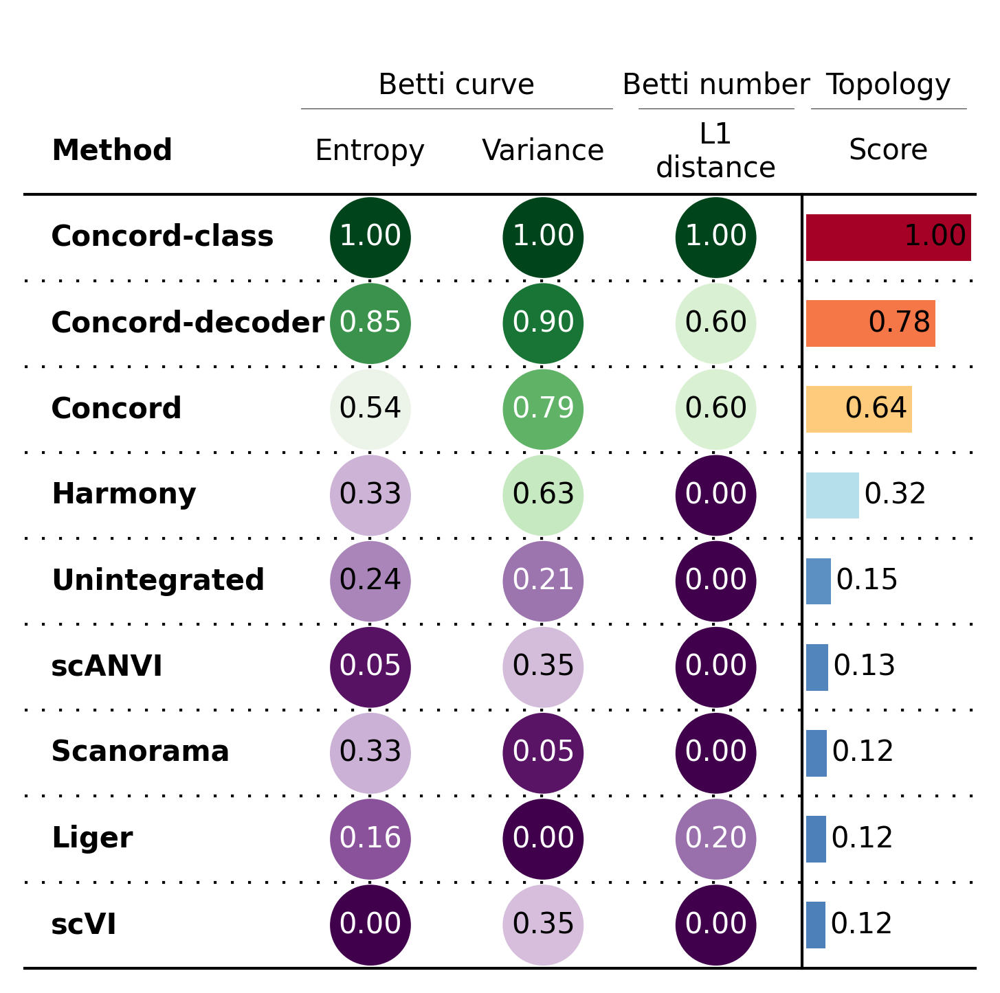

In [35]:
topology_results = ccd.ul.benchmark_topology(diagrams, expected_betti_numbers=[4,0,0], save_dir=save_dir, file_suffix=file_suffix)
max_betti = 5
topology_metrics = topology_results['combined_metrics'].drop(index=['PCA_no_noise', 'PCA_wt_noise'])
topology_metrics[('Betti number', 'L1 distance')] = topology_metrics[('Betti number', 'L1 distance')].clip(upper=5)
agg_name1 = 'Topology'
agg_name2 = 'Score'
topology_scores = ccd.ul.benchmark_stats_to_score(topology_metrics, min_max_scale=True, one_minus=True, aggregate_score=True, aggregate_score_name1=agg_name1, aggregate_score_name2=agg_name2, rank=True, rank_col=(agg_name1,agg_name2), name_exact=False)
ccd.pl.plot_benchmark_table(topology_scores, pal='PRGn', pal_agg='RdYlBu_r', cmap_method = 'minmax', agg_name = agg_name1, save_path=save_dir / f"topology_results_{file_suffix}.pdf", figsize=(6, 6), dpi=300)

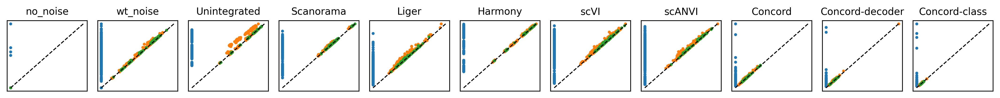

In [33]:
# Reorder diagrams with the same order as the combined keys
diagrams_ordered = {key: diagrams[key] for key in combined_keys}
# Change the key names to remove 'PCA_'
diagrams_ordered = {key.replace('PCA_', ''): diagrams_ordered[key] for key in diagrams_ordered}
ccd.pl.plot_persistence_diagrams(diagrams_ordered, base_size=(1.3, 1.5), dpi=300, marker_size=4, n_cols=11, fontsize=10, save_path=save_dir / f"persistence_diagrams_{file_suffix}.pdf", legend=False, label_axes=False, axis_ticks=False)

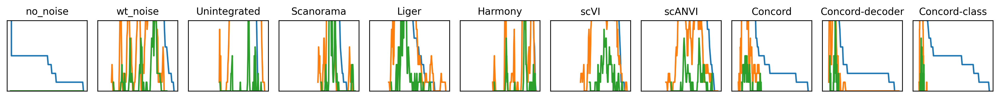

In [34]:
ccd.pl.plot_betti_curves(diagrams_ordered, nbins=100, base_size=(1.3, 1.5), n_cols=11, fontsize=10, save_path=save_dir / f"betti_curves_{file_suffix}.pdf", dpi=300, legend=False, label_axes=False, axis_ticks=False)

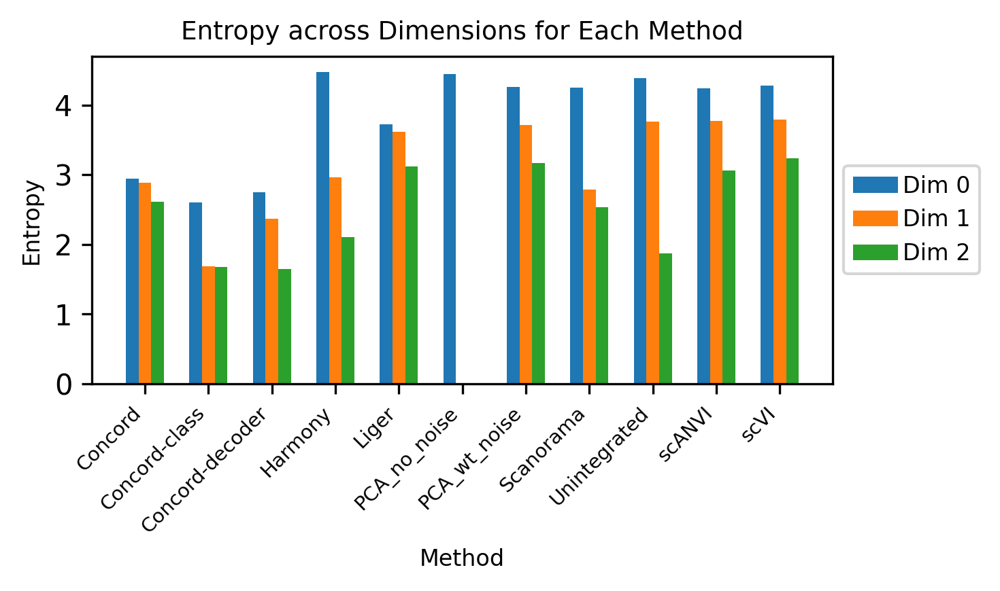

In [102]:
ccd.pl.plot_betti_statistic(topology_results['betti_stats'], statistic='Entropy', pal='tab10',
                            figsize=(5, 3), dpi=300, 
                             save_path=save_dir / f"betti_entropy_{file_suffix}.pdf")

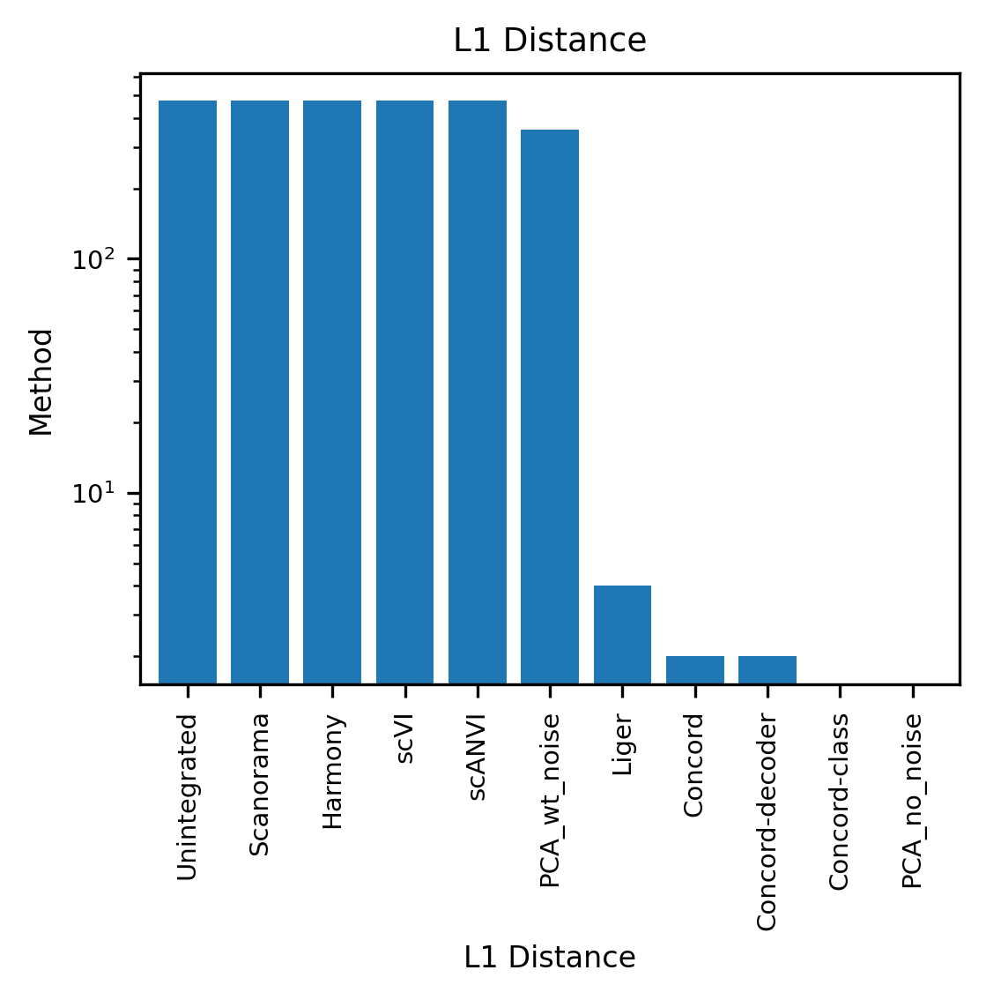

In [101]:
ccd.pl.plot_bar(
    topology_results['distance_metrics'], 
    key = 'L1 Distance',
    order=True, ascending=False, barh=False, legend=False,
    xlabel_fontsize=8, ylabel_fontsize=8, 
    log_scale=True,
    tick_fontsize=7, title_fontsize=9, bar_width=0.8,
    figsize=(4, 3), dpi=300, 
    save_path=save_dir / f"distance_metrics_{file_suffix}.pdf"
)

knn graph:

In [78]:
adata.obs[state_key].value_counts()

cluster
0    200
1    102
2     93
3     52
4     33
Name: count, dtype: int64

Concord.model.knn - WARNING - Mask inconsistency: more than expected neighbors found in one or more rows.
Concord.model.knn - WARNING - Mask inconsistency: more than expected neighbors found in one or more rows.
Concord.model.knn - WARNING - Mask inconsistency: more than expected neighbors found in one or more rows.
Concord.model.knn - WARNING - Mask inconsistency: more than expected neighbors found in one or more rows.
Concord.model.knn - WARNING - Mask inconsistency: more than expected neighbors found in one or more rows.
Concord.model.knn - WARNING - Mask inconsistency: more than expected neighbors found in one or more rows.
Concord.model.knn - WARNING - Mask inconsistency: more than expected neighbors found in one or more rows.
Concord.model.knn - WARNING - Mask inconsistency: more than expected neighbors found in one or more rows.
Concord.model.knn - WARNING - Mask inconsistency: more than expected neighbors found in one or more rows.
Concord.model.knn - WARNING - Mask inconsisten

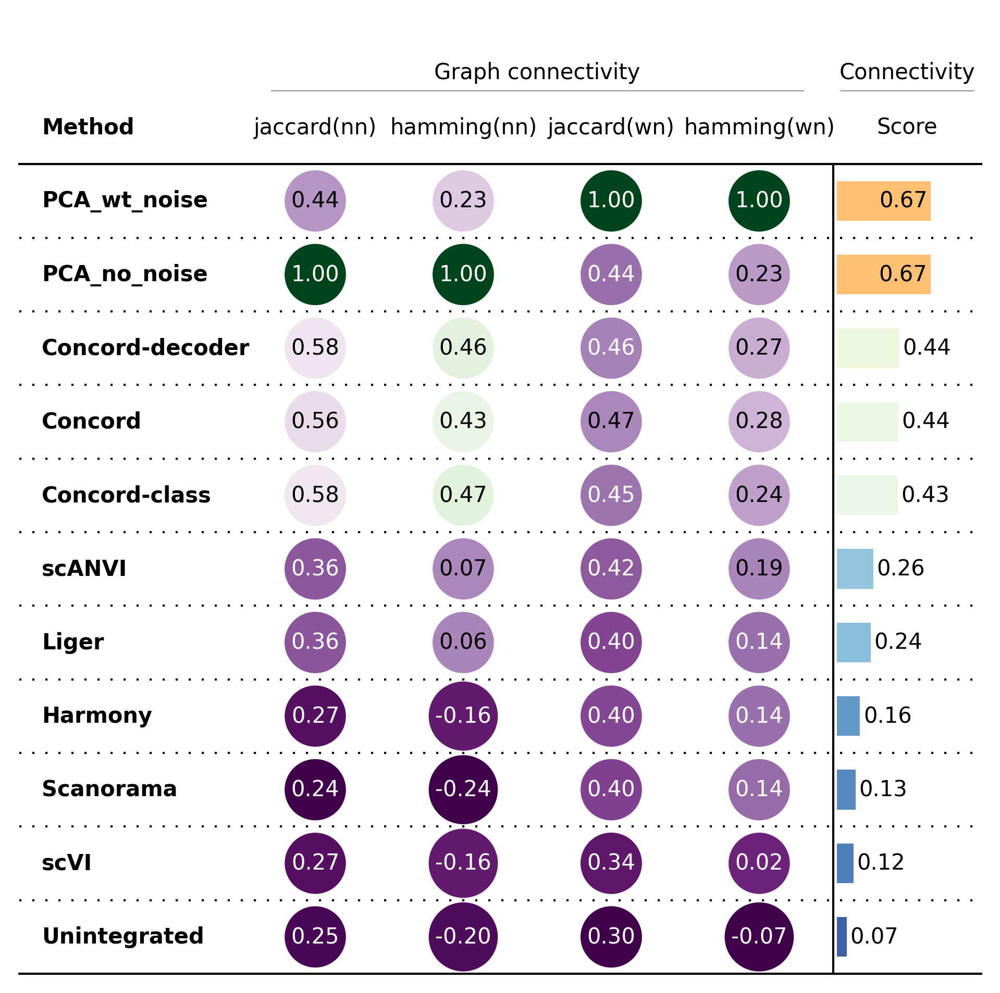

In [77]:
# compare connectivity for latent vs ground truth, store the result in a pandas dataframe
groundtruth_keys = {'(nn)': 'PCA_no_noise','(wn)': 'PCA_wt_noise'}
connectivity_df = ccd.ul.benchmark_graph_connectivity(adata, emb_keys=combined_keys, groundtruth_keys=groundtruth_keys, k=100, use_faiss=False)
agg_name1 = 'Connectivity'
agg_name2 = 'Score'
connectivity_scores = ccd.ul.benchmark_stats_to_score(connectivity_df, min_max_scale=False, one_minus=False, aggregate_score=True, aggregate_score_name1=agg_name1, aggregate_score_name2=agg_name2, rank=True, rank_col=(agg_name1,agg_name2), name_exact=False)
ccd.pl.plot_benchmark_table(connectivity_scores, pal='PRGn', pal_agg='RdYlBu_r', cmap_method = 'minmax', agg_name = agg_name1, save_path=save_dir / f"connectivity_results_{file_suffix}.pdf", figsize=(8, 8), dpi=300)


# Geomtric Features 

### Integrated benchmark pipeline

In [18]:
geometry_metrics = ['cell_distance_corr', 'local_distal_corr', 'trustworthiness', 'state_distance_corr', 'state_dispersion_corr', 'state_batch_distance_ratio']
dist_metric = 'cosine'
corr_types = ['pearsonr', 'spearmanr', 'kendalltau']
groundtruth_key = 'PCA_wt_noise'

#groundtruth_key = 'PCA_no_noise'
# Convert state_dispersion to a dict of groundtruth dispersion
#groundtruth_dispersion = {'cluster_' + str(i): state_dispersion[i]**2 for i in range(5)} # convert to variance
geometry_df, geometry_full = ccd.ul.benchmark_geometry(adata, keys=combined_keys, eval_metrics=geometry_metrics, 
                                      dist_metric=dist_metric,
                                      corr_types = corr_types,
                                      groundtruth_key = groundtruth_key,
                                      state_key = state_key,
                                      batch_key = batch_key,
                                      #groundtruth_dispersion = groundtruth_dispersion,
                                      dispersion_metric='var',
                                      return_type='full',
                                      start_point=0,
                                      end_point=adata.n_obs-1,
                                      pseudotime_k = 30,
                                      truetime_key = 'time',
                                      save_dir=save_dir, 
                                      file_suffix=file_suffix)

Concord - INFO - Computing cell distance correlation
Concord - INFO - Computing local vs distal correlation
Concord - INFO - Computing trustworthiness
Concord - INFO - Computing cluster centroid distances correlation
Concord - INFO - Computing state dispersion correlation
Concord - INFO - Computing state-batch distance ratio


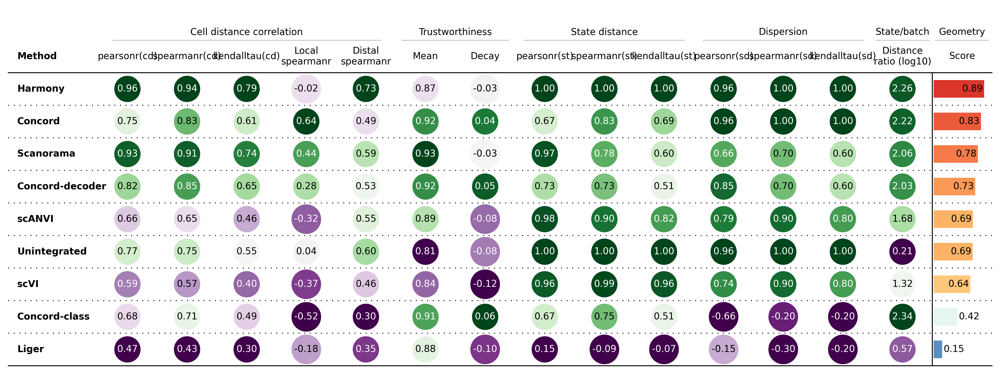

In [19]:
agg_name1 = 'Geometry'
agg_name2 = 'Score'
geometry_scores = ccd.ul.benchmark_stats_to_score(
    geometry_df.drop(index=['PCA_no_noise', 'PCA_wt_noise']), fillna = 0,               
    min_max_scale=False, one_minus=False, aggregate_score=True, aggregate_score_name1=agg_name1, aggregate_score_name2=agg_name2, rank=True, rank_col=(agg_name1,agg_name2))
ccd.pl.plot_benchmark_table(geometry_scores, pal='PRGn', pal_agg='RdYlBu_r', cmap_method = 'minmax', agg_name = agg_name1, save_path=save_dir / f"geometry_results_noscale_{dist_metric}_{groundtruth_key}_{file_suffix}.pdf", figsize=(19, 7), dpi=300)

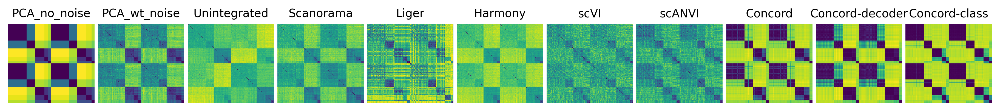

In [15]:
ccd.pl.plot_distance_heatmap(geometry_full['cell_distance_corr']['distance'], n_cols = 11, figsize=(1.1,1.3), cbar=False, dpi=300, save_path=save_dir / f"cell_distance_hmap_{file_suffix}.svg")

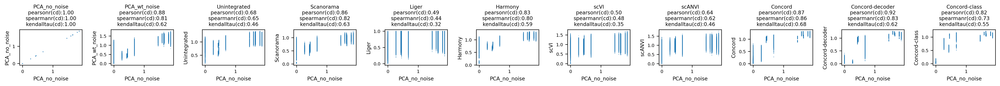

In [104]:
ccd.pl.plot_geometry_scatter(
    data_dict = geometry_full['cell_distance_corr']['distance'], 
    correlation= geometry_full['cell_distance_corr']['correlation'],
    ground_key=groundtruth_key,
    n_cols = 11, figsize=(2,2), dpi=300, save_path=save_dir / f"cell_distance_scatter_{groundtruth_key}_{file_suffix}.pdf")

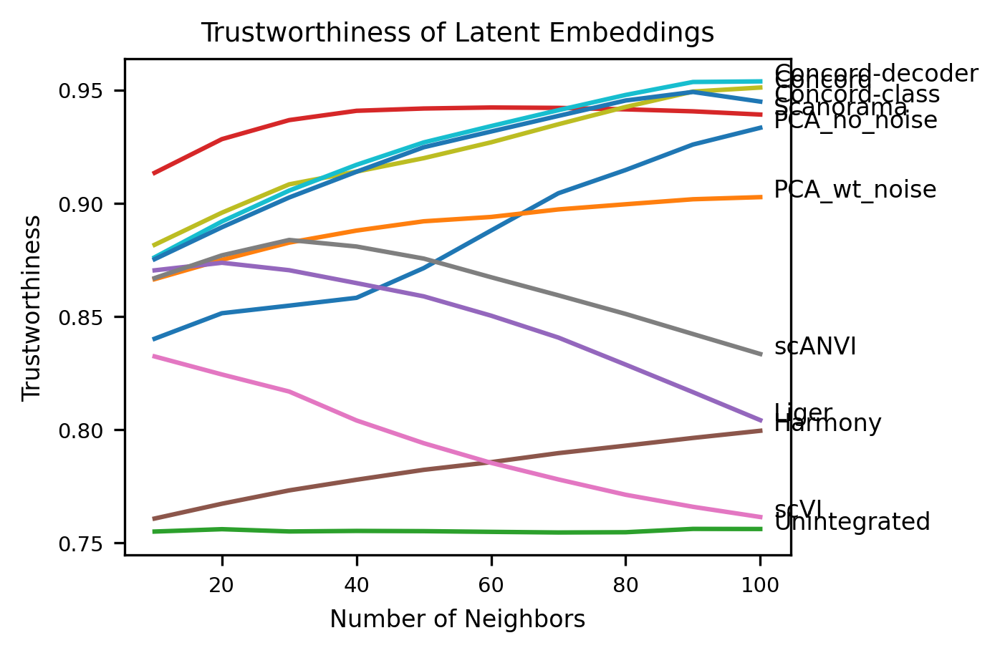

In [105]:
trustworthiness_scores = geometry_full['trustworthiness']['scores']
ccd.pl.plot_trustworthiness(trustworthiness_scores, text_shift=2, legend=False, save_path=save_dir / f"trustworthiness_{groundtruth_key}_{file_suffix}.pdf", figsize=(4,3))

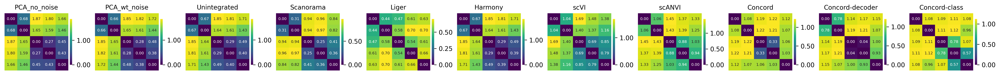

In [20]:
ccd.pl.plot_distance_heatmap(geometry_full['state_distance_corr']['distance'], 
    n_cols = 11, annot_value=True,
    figsize=(2,1.6), dpi=300, save_path=save_dir / f"cell_distance_hmap_{groundtruth_key}_{file_suffix}.svg")

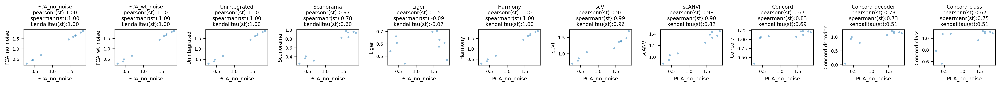

In [21]:
ccd.pl.plot_geometry_scatter(
    data_dict = geometry_full['state_distance_corr']['distance'], 
    correlation= geometry_full['state_distance_corr']['correlation'],
    s=10,
    n_cols = 11, figsize=(2,2), dpi=300, save_path=save_dir / f"state_distance_scatter_{groundtruth_key}_{file_suffix}.pdf")

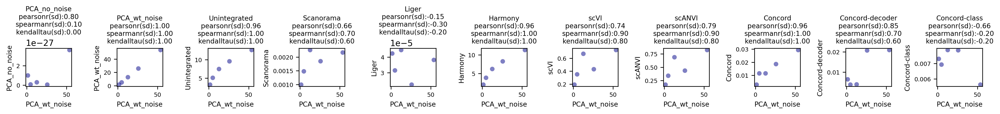

In [32]:
ccd.pl.plot_geometry_scatter(
    data_dict = geometry_full['state_dispersion_corr']['dispersion'], 
    correlation= geometry_full['state_dispersion_corr']['correlation'],
    s=30, c='darkblue',
    ground_key = groundtruth_key,
    n_cols = 11, figsize=(1.5,2.0), dpi=300, save_path=save_dir / f"state_dispersion_scatter_{groundtruth_key}_{file_suffix}.pdf")

### 2.0 Decoder reconstruction

In [110]:
adata.layers

Layers with keys: Concord-decoder_decoded_batch_1, Concord-decoder_decoded_batch_2, Liger_corrected, Scanorama_corrected, counts, scANVI_corrected_batch_1, scVI_corrected_batch_1, wt_noise, no_noise

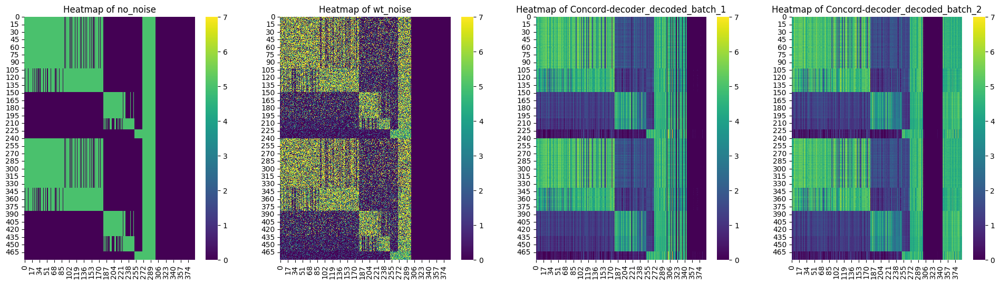

In [83]:
# Align and copy the layer data based on observation names
adata.layers['no_noise'] = np.zeros_like(adata.X)

# Find the indices of common genes between `adata` and `adata_state`
common_genes = adata.var_names.intersection(adata_state.var_names)
adata_indices = adata.var_names.get_indexer(common_genes)
adata_state_indices = adata_state.var_names.get_indexer(common_genes)

# Copy data from `adata_state` to `adata` for these common genes
adata.layers['no_noise'][:, adata_indices] = adata_state.layers['no_noise'][:, adata_state_indices].copy()

decoded_layers = ['Concord-decoder_decoded_batch_1', 'Concord-decoder_decoded_batch_2']
show_layers = ['no_noise', 'wt_noise'] + decoded_layers
ccd.pl.plot_adata_layer_heatmaps(adata, ncells=None, ngenes=None, layers=show_layers, cmap='viridis', vmin=0, vmax=7, 
                                 obs_keys=[state_key, batch_key], transpose=False, figsize=(6,6),  dpi=300, save_path=save_dir/f'decoded_heatmap_{file_suffix}.png')

In [115]:
# Compute the reconstruction error between the original and reconstructed data
mse_no_noise = np.zeros(len(decoded_layers))
mse_wt_noise = np.zeros(len(decoded_layers))
state_genes = adata.var_names[adata.var_names.isin(adata_state.var_names)]
for layer in decoded_layers:
    mse_no_noise[decoded_layers.index(layer)] = ccd.ul.compute_reconstruction_error(adata[:,state_genes], 'no_noise', layer, metric='mse')
    mse_wt_noise[decoded_layers.index(layer)] = ccd.ul.compute_reconstruction_error(adata[:,state_genes], 'wt_noise', layer, metric='mse')

# Report value, mean
print(f"MSE between no_noise and decoded layers: {mse_no_noise}")
print(f"MSE between wt_noise and decoded layers: {mse_wt_noise}")
print(f"Mean MSE between no_noise and decoded layers: {np.mean(mse_no_noise):.4f}")
print(f"Mean MSE between wt_noise and decoded layers: {np.mean(mse_wt_noise):.4f}")


MSE between no_noise and decoded layers: [1.54782357 1.57474586]
MSE between wt_noise and decoded layers: [9.76465605 9.77529761]
Mean MSE between no_noise and decoded layers: 1.5613
Mean MSE between wt_noise and decoded layers: 9.7700
